---
title: "Main Narrative"
exports:
  - format: pdf
    output: pdf_builds/main.pdf
---


In [1]:
from pathlib import Path
from IPython.display import Image, display, Markdown

# Group 14 Final: 

This project uses the CalEnviroScreen 4.0 dataset, released by the California Office of Environmental Health Hazard Assessment (OEHHA). The dataset provides census-tract–level information across California, integrating a wide range of environmental pollution indicators and socioeconomic vulnerability measures. Environmental indicators include ozone, fine particulate matter (PM2.5), traffic density, pesticide use, and toxic releases, which together characterize pollution burden. Socioeconomic and population characteristics include educational attainment (EducatP), poverty rates (PovertyP), linguistic isolation (Ling_IsolP), and demographic composition by race and ethnicity, including the proportions of Hispanic, White, African American, and other racial groups. In addition to individual indicators, the dataset includes composite CalEnviroScreen scores and percentiles that summarize cumulative environmental and social disadvantage. 

## Chart Visualizations:

We sought to reproduce the charts of 'Analysis of Race/Ethnicity and CalEnviroScreen 4.0 Scores' report. 

**Figure 1. CalEnviroScreen 4.0 Score by Racial or Ethnic Group**

![original figure 1](visualizations/descriptive_charts/reported_fig1.png)

The original report generated this figure using individual-level data, where each observation represents a single Californian. With this structure, they were able to assign each person a CalEnviroScreen 4.0 percentile score based on their census tract and then group individuals by race/ethnicity to compute the accurate score distribution for each group.

However, our dataset is at the county level. While we had the total population data, generating the long-format dataset by repeatedly appending observations was avoided due to high time consumption. Thus we approximately generated the boxplot by assigning each county to the race/ethnicity group with the highest proportion.

![reproduced figure 1](visualizations/descriptive_charts/fig1_majorityrace_BaW.png)

The comparison between the original figure 1 and the reproduced analysis confirms the severe structural environment injustice in California. The African American (corresponding to Black) and Hispanic (corresponding to Latino) groups shows the consistently highest median vulnerability score, and the White group shows the lowest. This indicates that Hispanic and African American populations tend to live in communities with higher pollution burdens and vulnerabilities than the other/racial/ethnic groups analyzed. \
\
However, the methodology used for the reproduction seemingly inflated the median scores significantly compared to the original report. Also, the extremely low count for the Native American group (n=4) makes its derived median unreliable for comparison purposes.

**Figure 2. Race in the Least and Most Impacted Census Tracts of CalEnviroScreen 4.0.**

![original figure 2](visualizations/descriptive_charts/reported_fig2.png) 

![reproduced figure 2](visualizations/descriptive_charts/fig2_topbottom_piechart.png)

**Figure 3. Racial Makeup of Each Decile of CalEnviroScreen 4.0 Score.**

![original figure 3](visualizations/descriptive_charts/reported_fig3.png)

![reproduced figure 3](visualizations/descriptive_charts/fig3_racialmakeupbydecile_barchart.png)

The results are consistent with the original conclusions, reaffirming the environmental racial inequity within California.
As environmental vulnerability increases (moving to higher deciles), the proportion of Hispanic and African American residents increases overwhelmingly. Conversely, the proportion of White residents decreases sharply as the disadvantage lessens, suggesting they predominantly reside in the most environmentally safe areas. This inequality is further highlighted when compared to the average bar representing the entire state of California at the bottom.

**Figure 4. Most prevalent race by census tracts were overlaid with most disadvantaged 10%
CalEnviroScreen scores.**

![original figure 4](visualizations/descriptive_charts/reported_fig4.png)

![reproduced figure 4](visualizations/descriptive_charts/fig4_top10perctracts_barchart.png)

We were able to reproduce the exact same numerical values as the original report. Although the proportion of African Americans appears small in Figure 3, the fact that 18% of counties where African Americans are the major racial group are environmentally vulnerable (21 out of 112 counties) is not that different from the Hispanic proportion. This shows why attention should be paid not only to Hispanics but also to African Americans.

**Additional Analysis**

Across key socioeconomic indicators—education, poverty, and linguistic isolation-, the correlation analysis shows that the Hispanic proportion exhibits consistently strong positive correlations with measures of disadvantage, with all correlation coefficients exceeding 0.7. In contrast, the White proportion shows consistently strong negative correlations with the same indicators, all exceeding -0.7 in magnitude. These relationships indicate that areas with a higher Hispanic population tend to have a larger proportion of residents with less than a high school education, higher poverty rates, and greater linguistic isolation, meaning more households with limited English proficiency. In contrast, areas with a higher White populations tend to have higher education levels and fewer linguistically isolated households.

![figure 5](visualizations/descriptive_charts/fig5_topbottom_educatP_piechart.png)

This relationship is especially pronounced at the lower end of the education distribution. In the 10% lowest education neighborhoods, the Hispanic population accounts for an average of 82%. This concentration is notably stronger than in neighborhoods grouped by other variables.

## Map Visualizations:

In this Map Visualization section, we present descriptive maps illustrating the spatial distribution of racial composition and cumulative environmental burden across geographic units. Race share maps display the proportion of each racial group using fixed bins to allow consistent comparisons across space. The bivariate maps jointly visualize race share and the CalEnviroScreen composite score (CIscore), which captures cumulative environmental burden by combining pollution exposure which is derived from factors such as pesticide use, ozone levels, traffic, and other environmental stressors with population characteristics. Finally, the overlap hotspot maps highlight areas that fall simultaneously in the upper tail of both race share and CIscore, identifying locations where higher concentrations of specific racial groups coincide with elevated cumulative environmental burden.

## Race share (fixed bins)

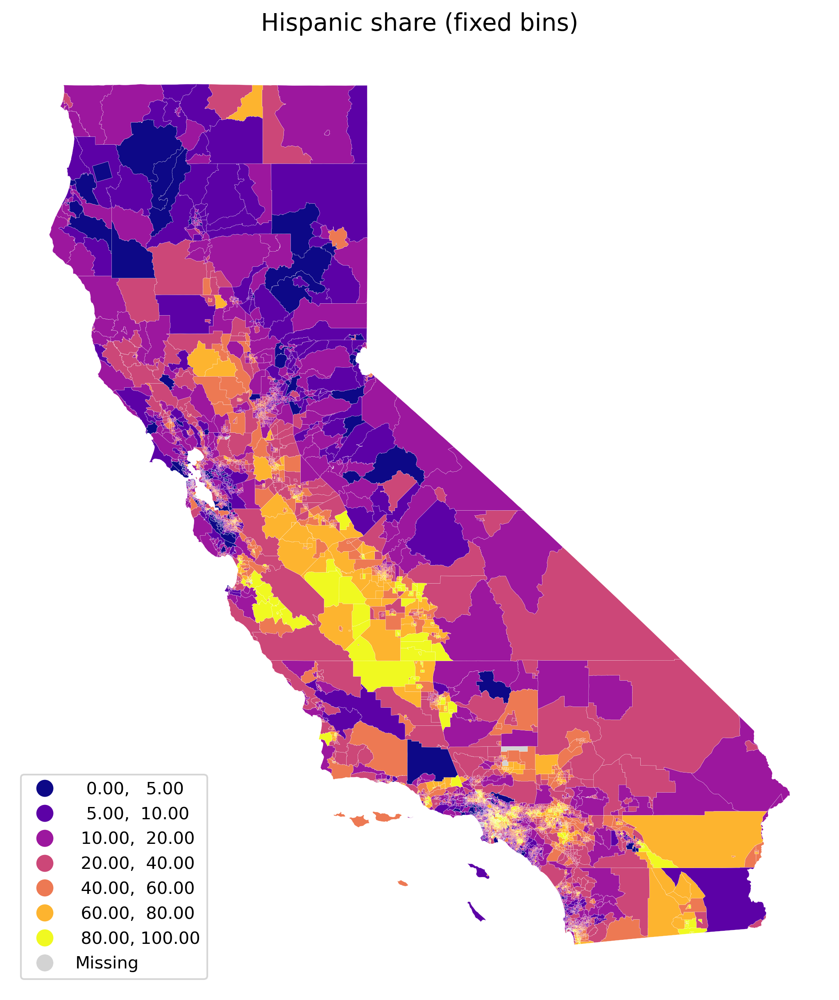

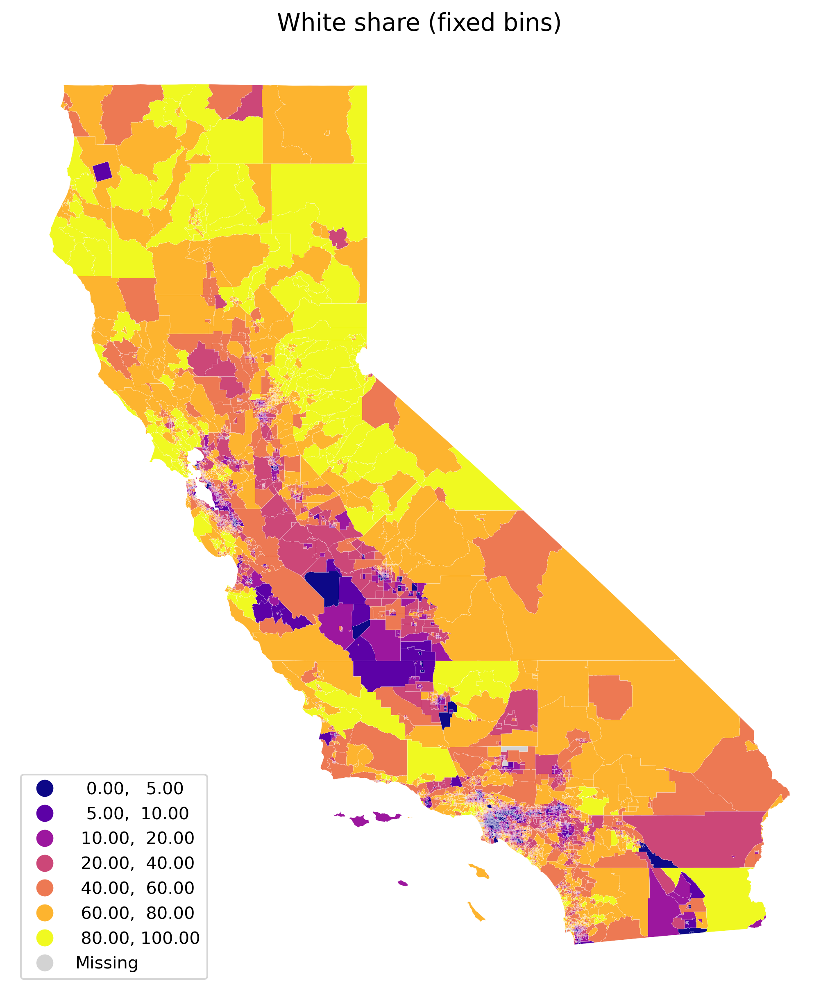

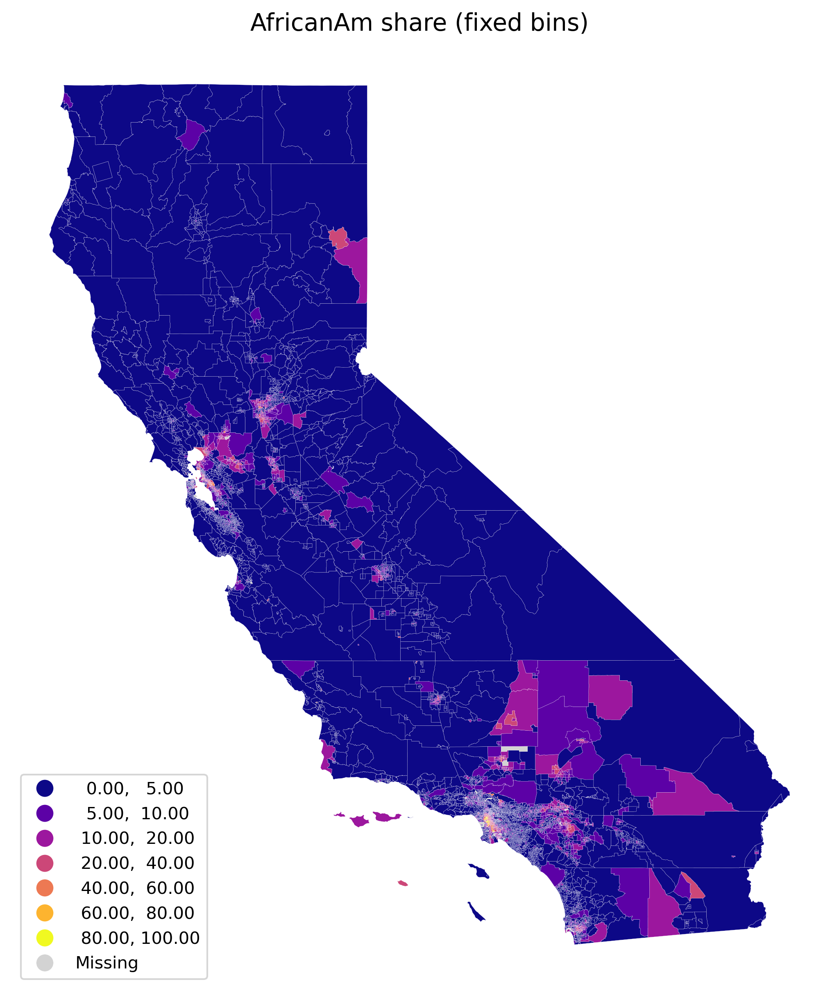

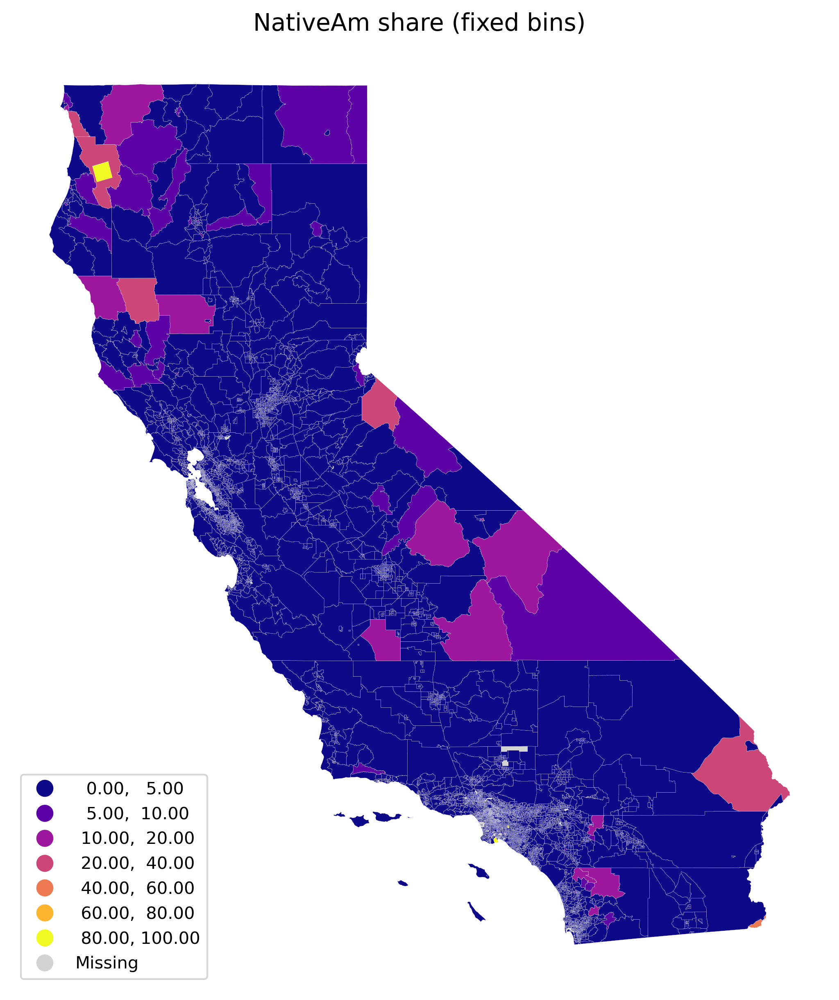

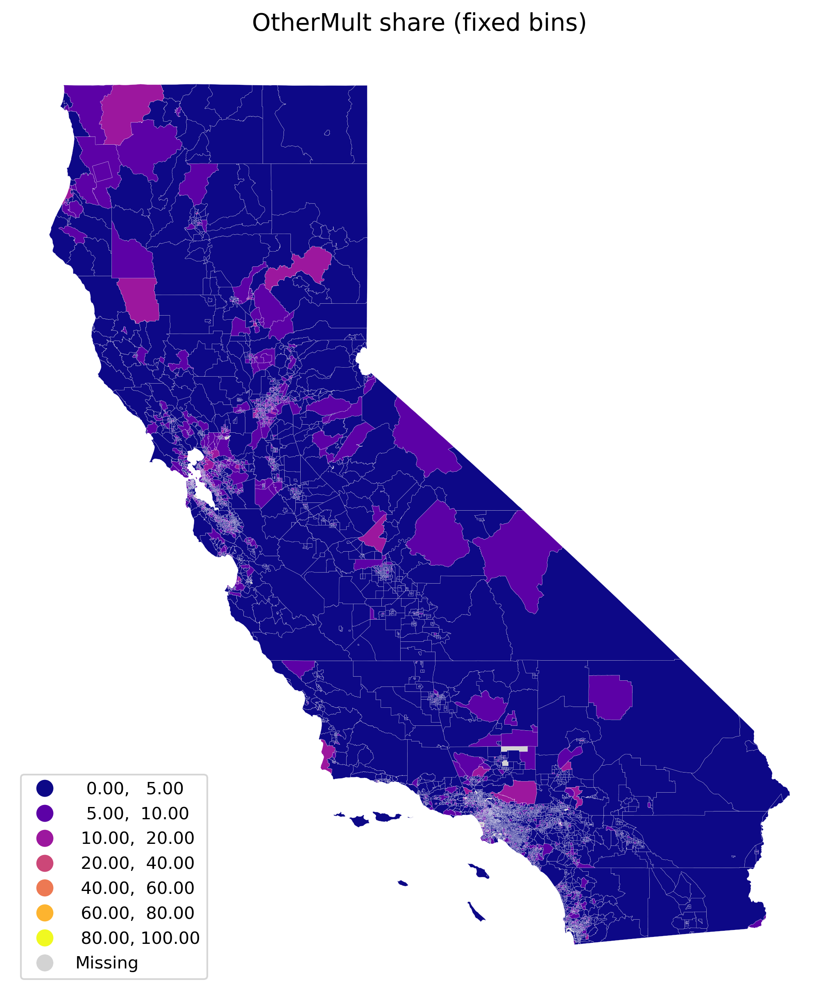

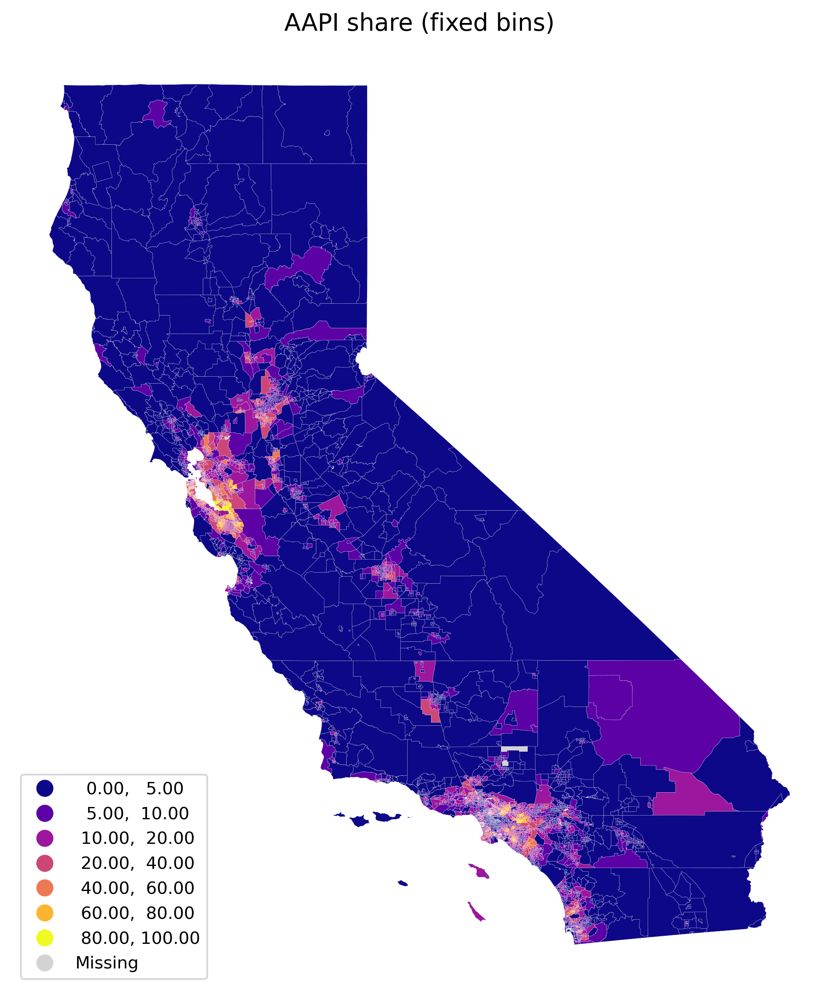

In [2]:
MAP_DIR = Path("visualizations/descriptive_maps")

race_cols = ['Hispanic','White','AfricanAm','NativeAm','OtherMult','AAPI']
burden = "CIscoreP"

display(Markdown("## Race share (fixed bins)"))
for r in race_cols:
    display(Image(filename=str(MAP_DIR / f"race_{r}_fixedbins.png"), width=300))

These fixed-bin maps reveal strong spatial clustering in racial composition across California. Hispanic population shares are highest in the Central Valley, Inland Empire, and parts of Southern California, while White population shares are comparatively higher in many rural and coastal counties, particularly in the northern and eastern parts of the state. African American population shares are generally low statewide but show clear concentration in specific urban areas, especially parts of the Bay Area and Los Angeles County. Native American population shares are small overall, with higher values appearing in select rural and inland regions. The “Other/Multiracial” category remains low across most tracts, with modest clustering in urban and suburban areas. In contrast, AAPI population shares are highly concentrated in major metropolitan regions, notably the Bay Area and Southern California, highlighting the pronounced urban concentration of Asian American and Pacific Islander communities. Using fixed bins across all maps allows for direct comparison across groups, making clear that racial composition in California is not evenly distributed but instead reflects distinct regional and urban patterns.

## Bivariate maps

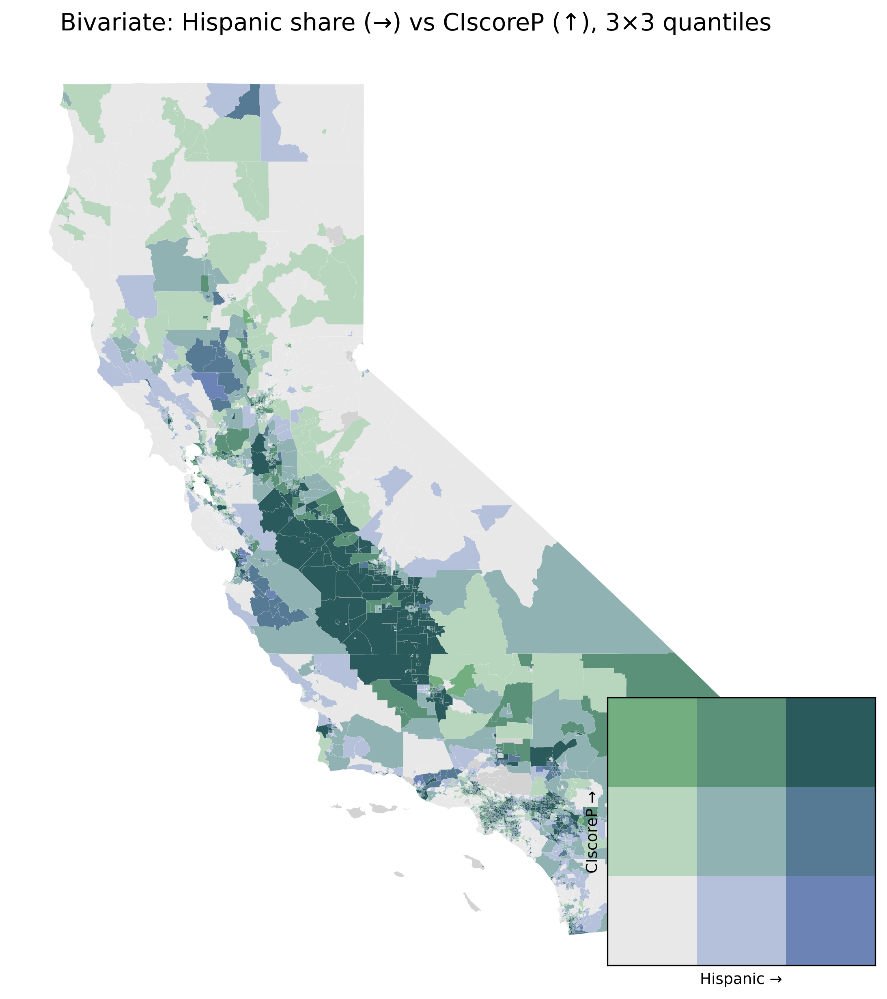

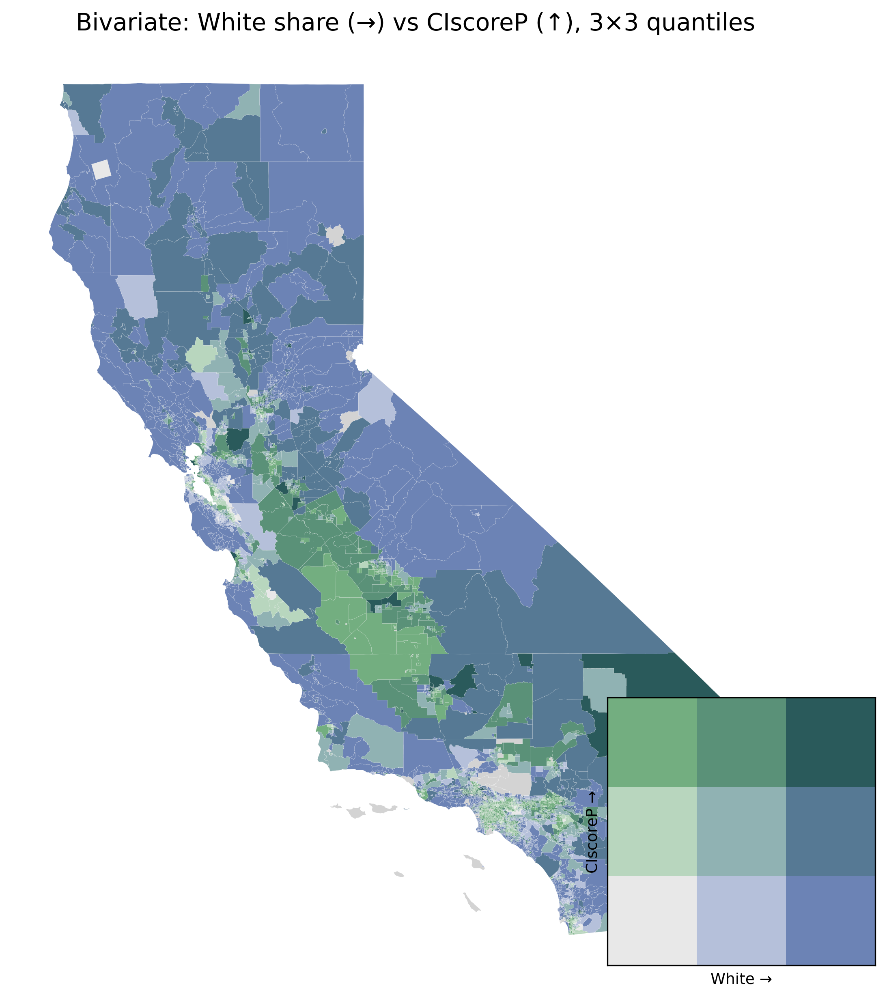

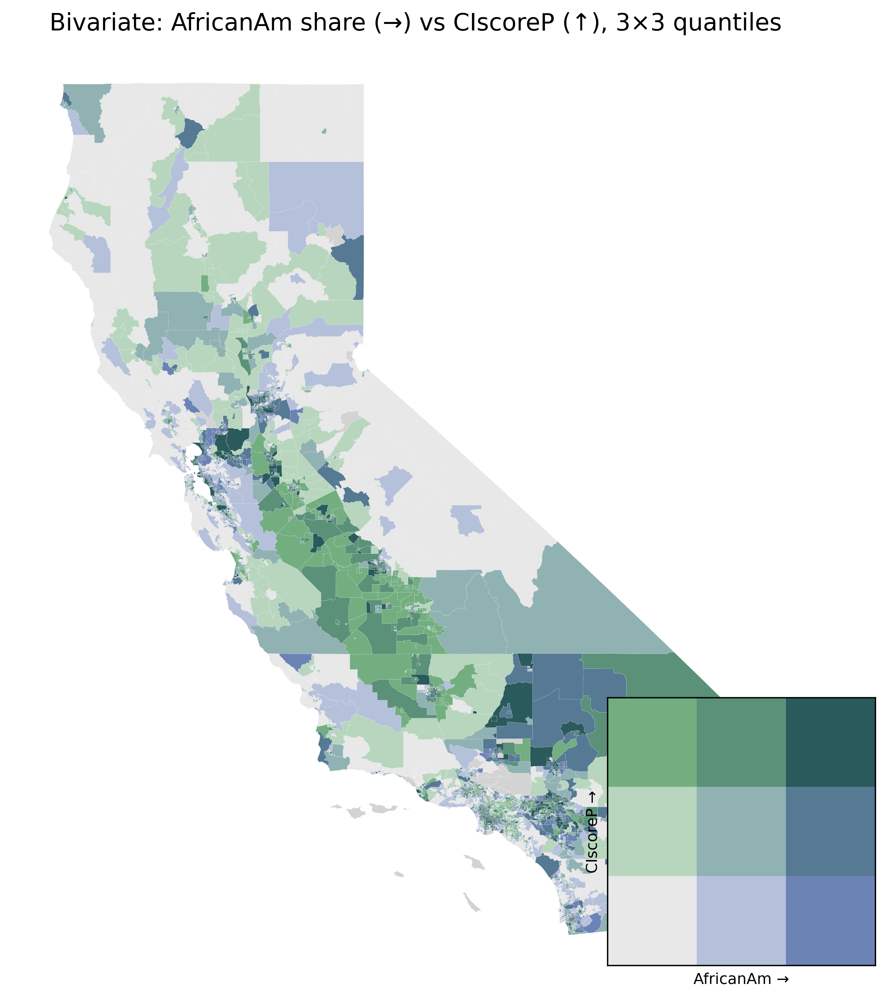

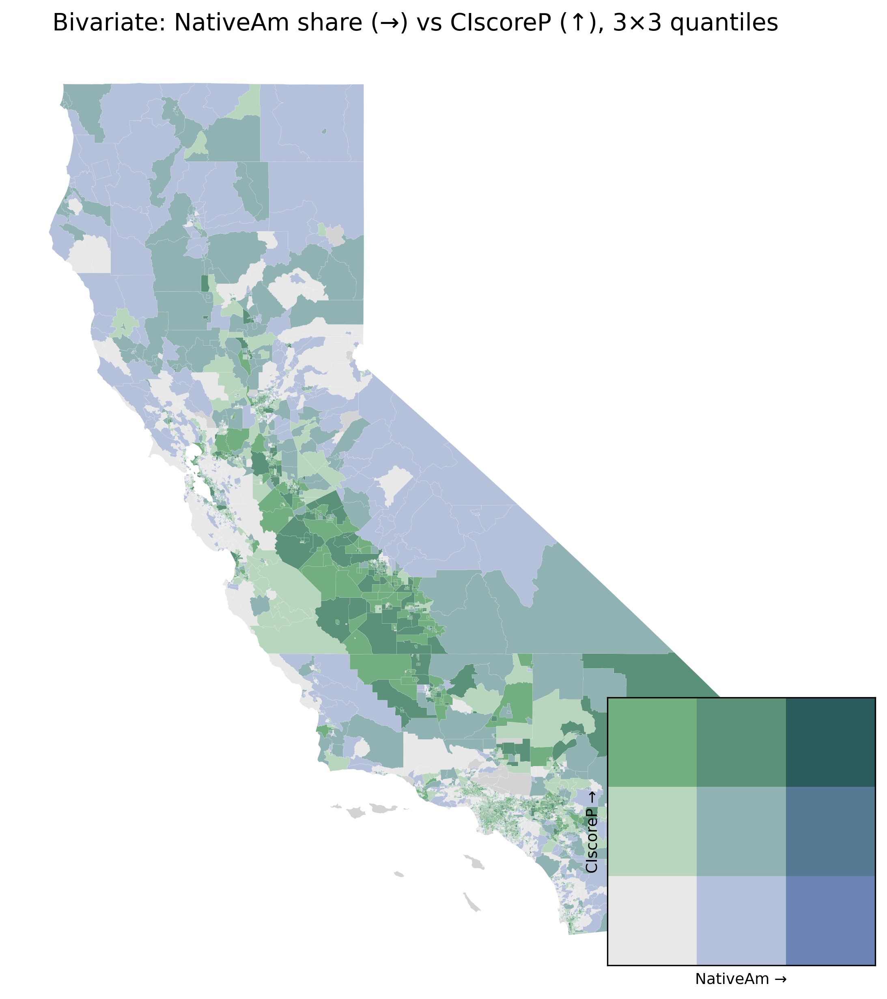

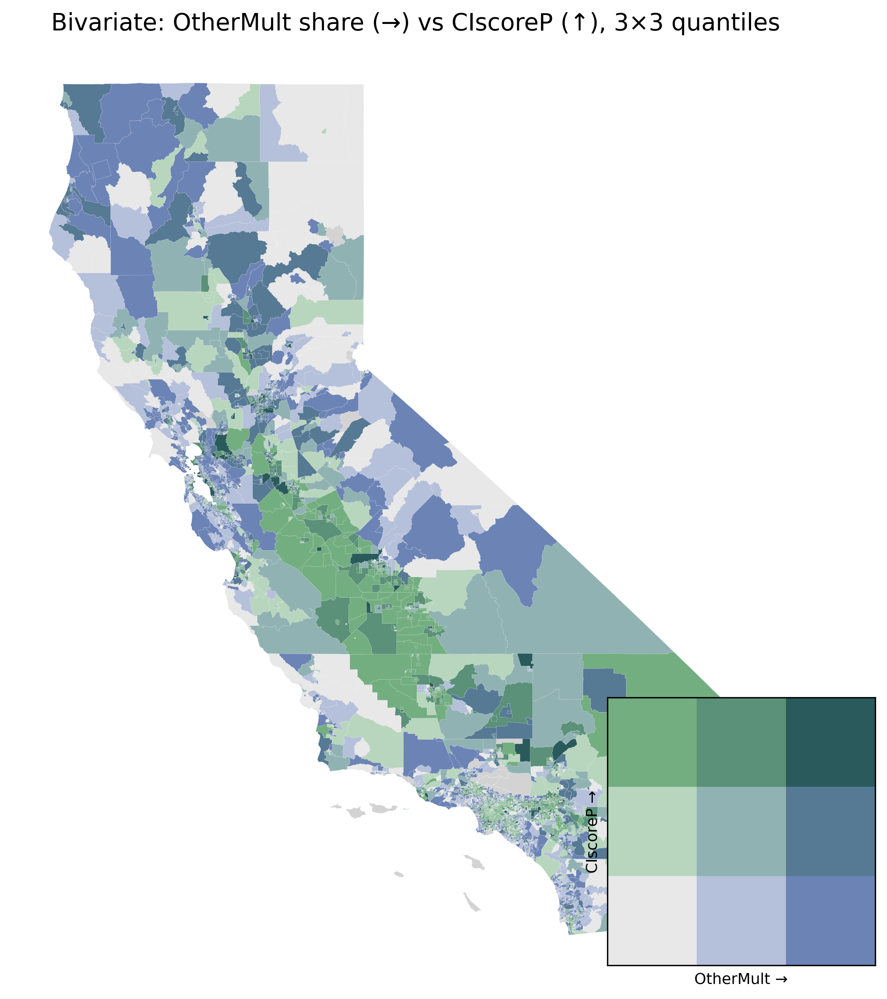

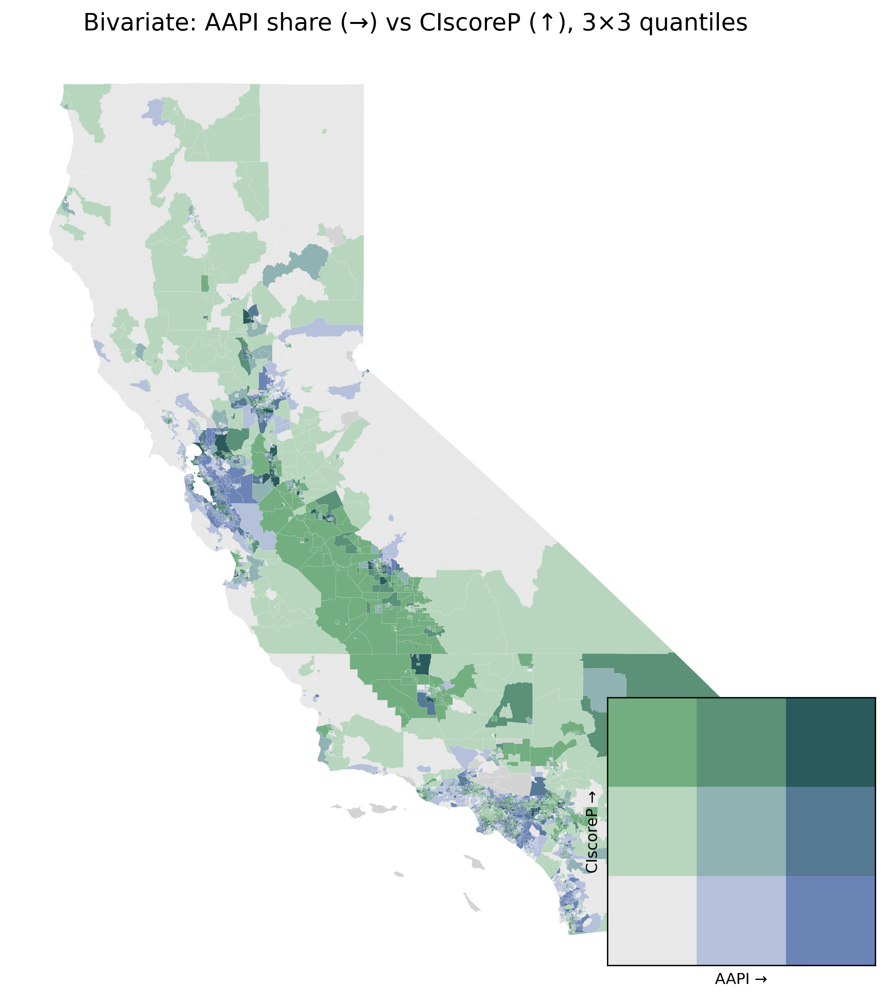

In [3]:
display(Markdown("## Bivariate maps"))
for r in race_cols:
    display(Image(filename=str(MAP_DIR / f"bivariate_{r}_{burden}.png"), width=300))


The bivariate maps make it clear that the relationship between racial composition and cumulative environmental burden differs substantially across groups. Census tracts with higher Hispanic population shares are disproportionately represented in the highest CI score categories, particularly across the Central Valley, Inland Empire, and Southern California, indicating a strong spatial overlap between Hispanic concentration and elevated cumulative pollution and population vulnerability. In contrast, tracts with higher White population shares are more likely to fall into the lowest CI score categories, suggesting that predominantly White areas experience comparatively lower cumulative environmental impacts. For African American populations, the association with CI scores is more localized: while overall population shares are low statewide, areas with higher African American concentrations in major metropolitan regions (especially in Los Angeles and the Bay Area) tend to coincide with higher CI scores. Native American population shares show a weaker and more heterogeneous relationship with CI scores, reflecting their concentration in rural and inland regions with mixed levels of cumulative impact rather than consistently high or low burden. The Other/Multiracial category displays modest alignment with higher CI scores in urban and suburban tracts, though patterns are less pronounced. Finally, AAPI population shares are concentrated in urban coastal regions where CI scores span the distribution, indicating that high AAPI concentration does not systematically correspond to the highest cumulative environmental burdens. Overall, these maps underscore that environmental exposure in California is unevenly distributed across racial groups, with particularly strong disparities affecting Hispanic communities.

## Overlap hotspots

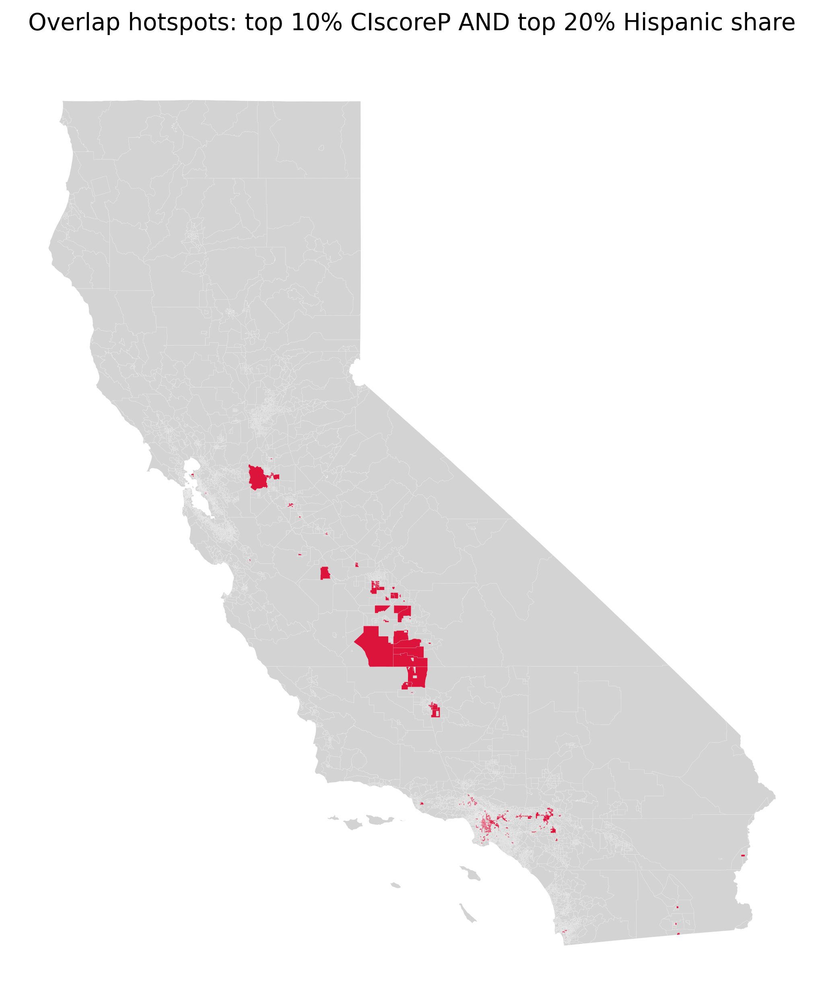

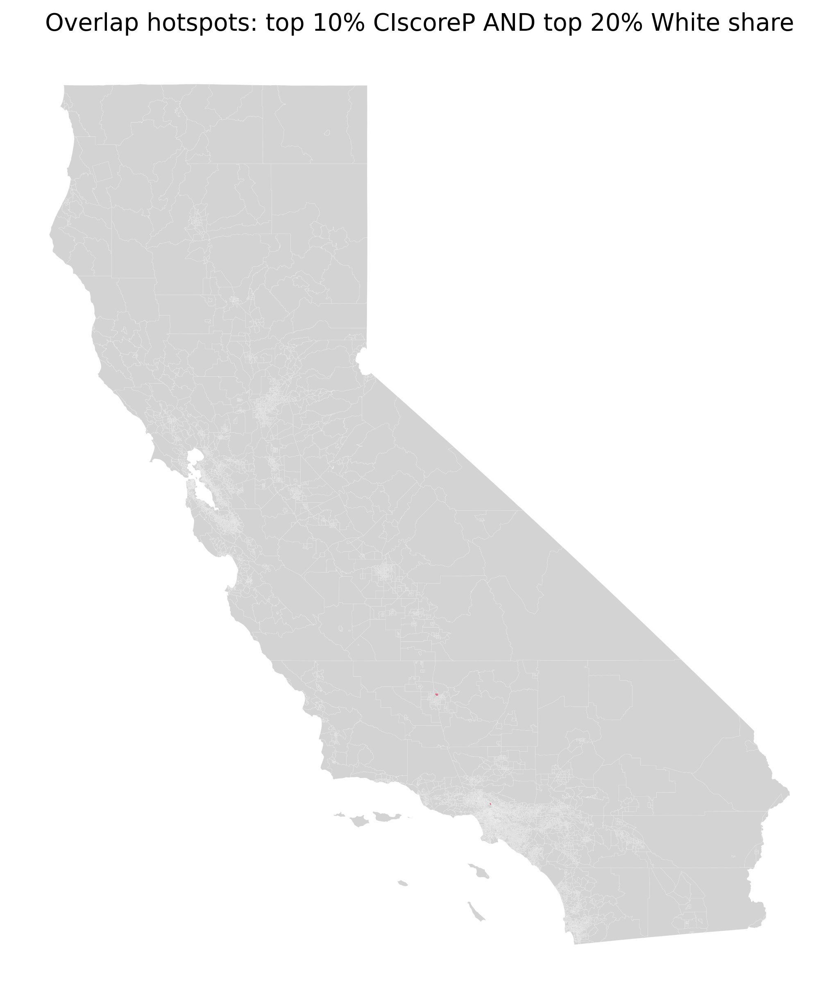

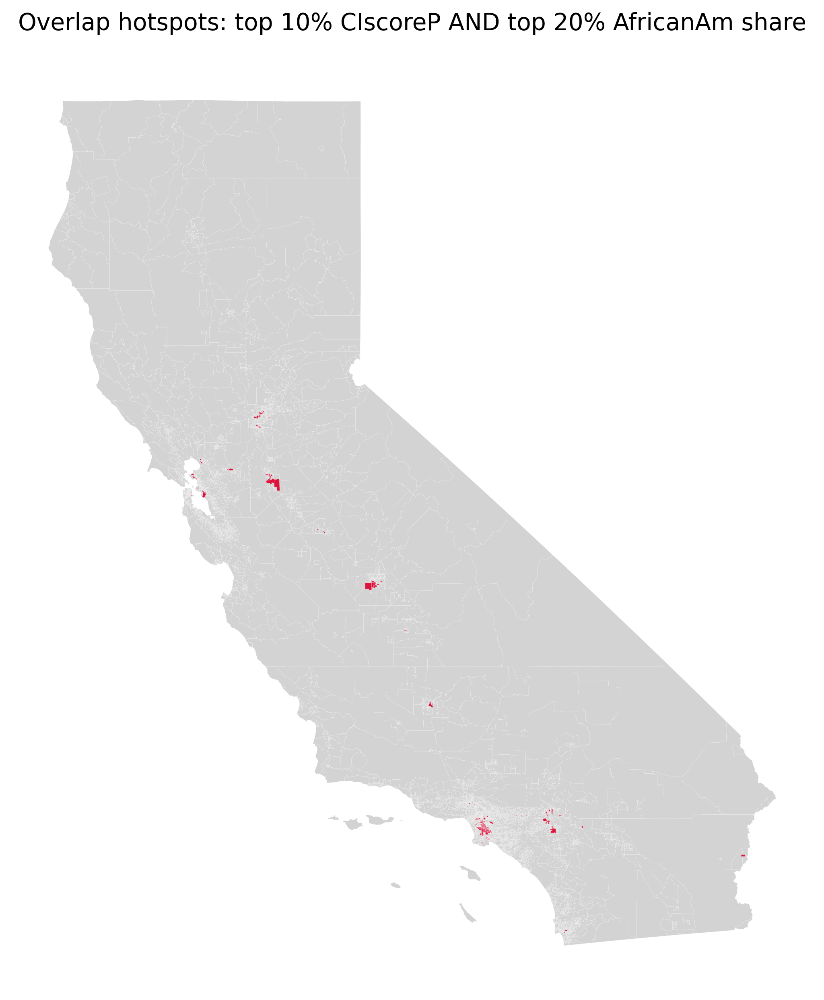

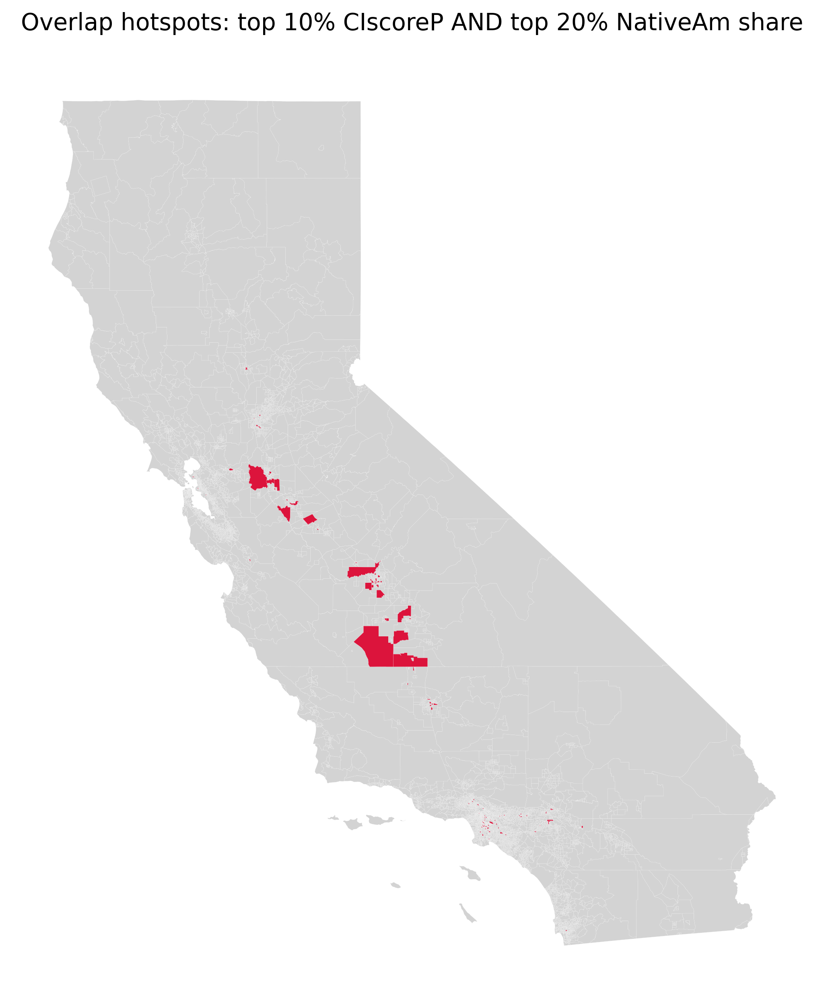

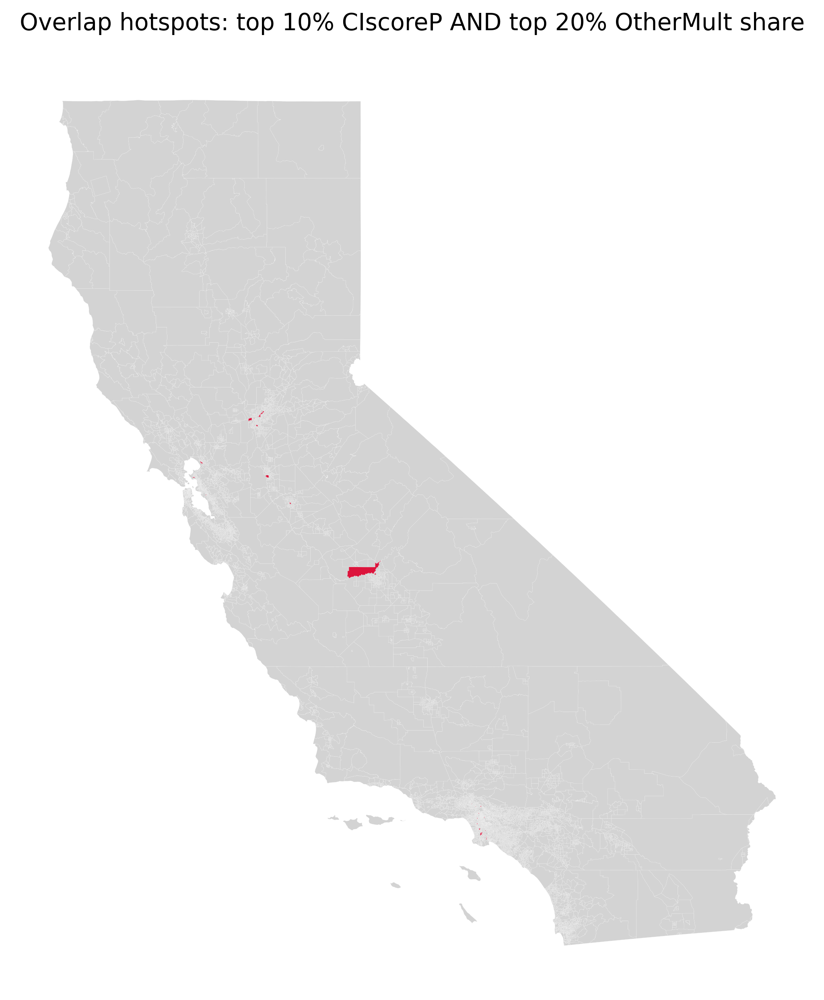

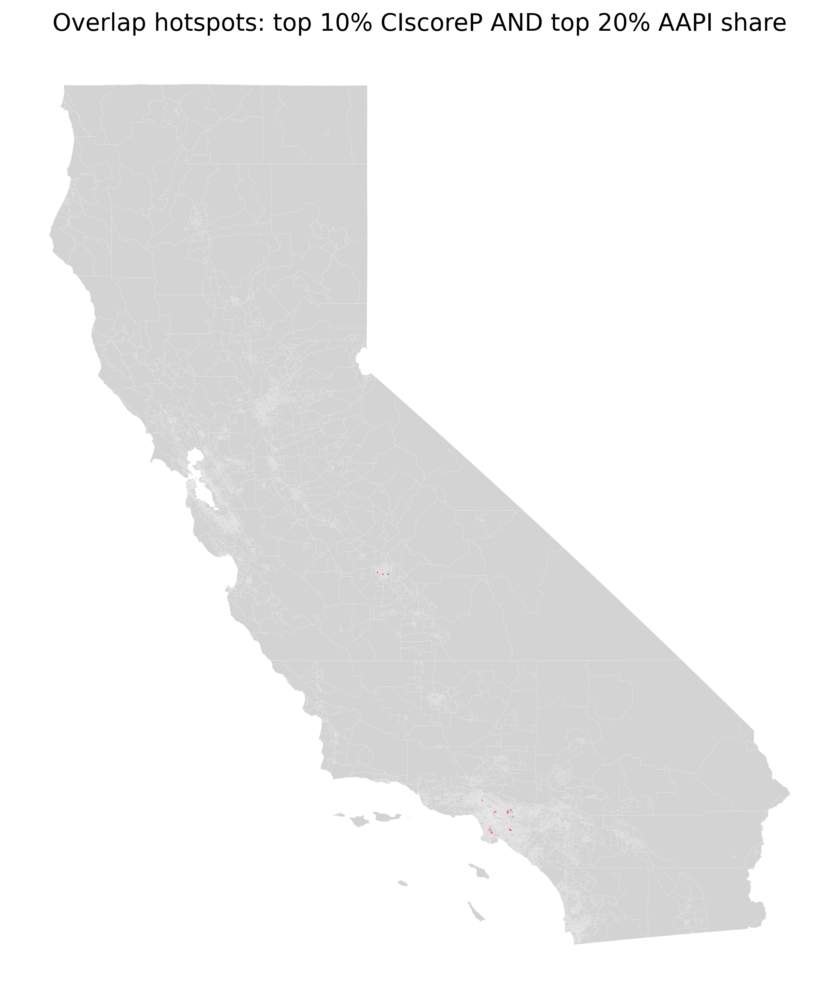

In [4]:
display(Markdown("## Overlap hotspots"))
for r in race_cols:
    display(Image(filename=str(MAP_DIR / f"overlap_hotspots_{r}_{burden}.png"), width=300))

The overlap hotspot maps identify census tracts that fall simultaneously in the top 10% of pollution burden and the top 20% of racial population share, making disparities in extreme exposure especially visible. Hotspots are most extensive for Hispanic populations, with large and contiguous clusters appearing in the Central Valley, Inland Empire, and parts of Southern California, indicating that heavily Hispanic communities are disproportionately represented among the most pollution-burdened areas in the state. In contrast, overlap hotspots for White population share are rare and highly dispersed, suggesting that predominantly White tracts are largely absent from the most extreme pollution burden categories. African American overlap hotspots are limited in number but clearly concentrated in specific urban regions, particularly in parts of Los Angeles County and the Bay Area, pointing to localized but severe exposure within major metropolitan areas. Native American overlap hotspots appear in select inland and rural regions, reflecting elevated pollution burdens in a smaller number of tracts with relatively high Native American population shares rather than widespread overlap. The Other/Multiracial category shows sparse and fragmented hotspots, primarily in urban areas, indicating weaker alignment with the most extreme pollution burdens. Finally, AAPI overlap hotspots are minimal and geographically constrained, reinforcing that high AAPI population shares do not systematically coincide with the highest pollution burden tracts. Overall, these overlap maps highlight that the most severe cumulative pollution burdens in California are disproportionately concentrated in Hispanic communities, while exposure among other groups tends to be more localized or limited in scope.

## K-Means Analysis

In this section, we use the K-Means clustering technique to see if Census Tracts can be typefied and grouped with other tracts sharing similar profiles of environmental burden and population characteristics, drawing on the CalEnviroScreen 4.0 indicators as well as tract-level racial composition. By clustering tracts across these dimensions, we aim to identify patterns of cumulative exposure to environmental harm and assess whether such exposure tends to co-occur with particular demographic configurations. The resulting clusters are not intended to represent causal relationships, but rather to provide a typology of Census Tracts that captures common exposure–demographic profiles.

K-Means is an unsupervised machine learning algorithm that groups observations into a preset number of clusters based on their similarity across a set of variables. The algorithm works by iteratively assigning each observation to the nearest cluster centroid and then updating those centroids to minimize within-cluster variation. The process continues until cluster assignments stabilize. For more information on K-Means

### Determining the appropriate number of clusters
As mentioned, the number of clusters used in K-Means is predetermined. The **Elbow Method** and **Silohuette Score** are two commonly used methods to help determine the appropriate number of clusters to set. These methods are described below.

The **Elbow Method** helps determine the appropriate number of clusters by plotting the Within Cluster Sum of Squares (WCSS) for a number of k values. This is referred to as interia, and it serves as a measure for how tightly clustered each defined group is. By plotting the number of clusters against the inertia, one can identify how intertia decreases with increased clusters, as the distance between any given observation decreases with an increased number of centroids. At some point, the decrease in inertia with every added cluster drops off, which is referred to as the "elbow" in the plot. The cluster value where the elbow occurs is typically seen as the appropriate cluster value. More information on the Elbow Method can be found [here.](https://www.geeksforgeeks.org/machine-learning/elbow-method-for-optimal-value-of-k-in-kmeans/)

The **Silohuette Score** measures how similar a data point is to its own cluster, compared to other clusters. t ranges from [-1,1], where a higher value indicates better defined clusters. For each data point, the score is based on the average distance to other points in the same cluster (within-cluster similarity) and the average distance to points in the nearest neighboring cluster (between-cluster separation). By plotting the average silhouette score across all observations for number of clusters, we can identify the number of clusters that yields the most clearly defined and well-separated groupings. More information on the Solihuette Score can be found [here.](https://www.geeksforgeeks.org/machine-learning/what-is-silhouette-score/)

For our dataset of Census Tracts, we started by removing any Tracts that had missing values, since KMeans does not accept missing values encoded as NaN. We then computed the inertia values and silohuette scores for cluster values from 2 to 10. The results are shown below.

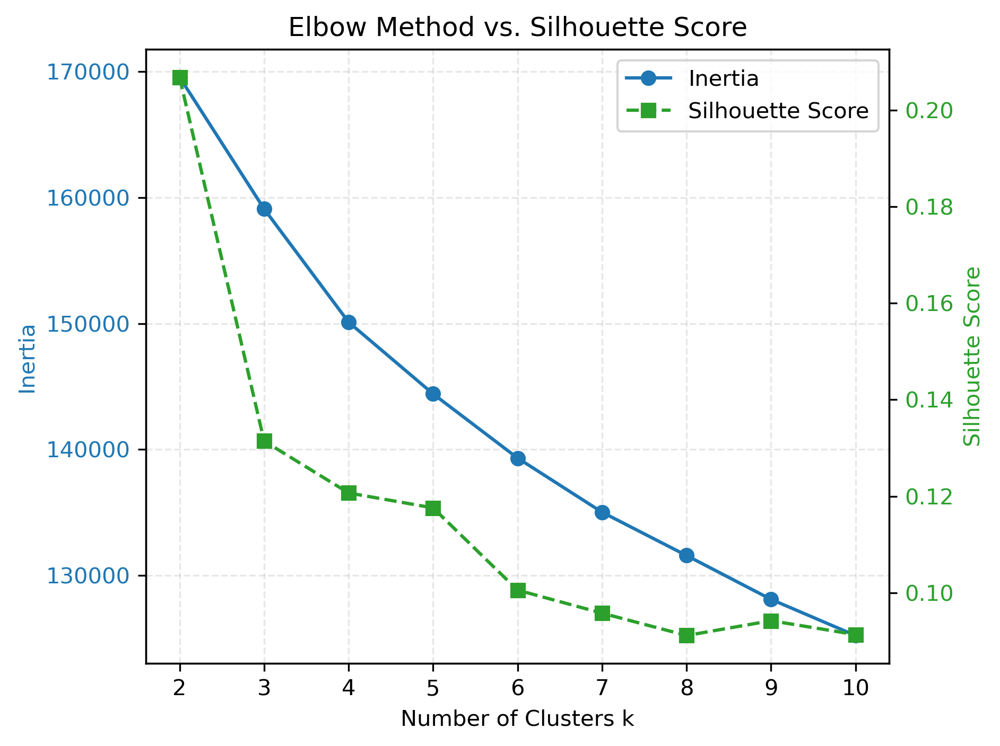

In [5]:
KMEANS_DIR = Path("visualizations/kmeans_visualizations")

display(Image(filename=str(KMEANS_DIR / "elbowvssilohuette_chart.png")))

Our Elbow Method and Silohuette Score results exhibit somewhat counterintuitive results, suggesting that these Census Tracts are not easily clustered. While we see intertia decrease with increasing clusters, there is no strongly defined "elbow". For our silohuette scores, 2 clusters give the highest value, though this value is still relatively low (around 0.21).

Our Elbow Method and silhouette score results exhibit somewhat counterintuitive patterns, suggesting that Census Tracts are not easily partitioned into well-defined clusters. While inertia decreases monotonically as the number of clusters increases, there is no clearly defined “elbow,” indicating that additional clusters do not yield a distinct improvement in within-cluster compactness. Similarly, the silhouette score is highest with 2 clusters; however, this value remains relatively low (approximately 0.21), implying weak separation between clusters even in the best-performing configuration.

With these results in mind, we test using both 2 clusters (highest silohuette score) and 4 clusters (after which we see decreases in intertia drop off somewhat).

### Two Clusters
We now look at the results when we set the number of clusters to 2.

The first plot shows the values for the centroids of each cluster. Each row corresponds to one cluster (Cluster 0 and Cluster 1) and each column is a feature (e.g., CIscoreP, PolBurdP, PovertyP, PM2_5_P, White, etc.). Colors represent standardized means, where yellow colors indicate above-average values and blue colors indicate below-average values. This chart shows us that Cluster 0 is one typefied by high CalEnviroscreen scores, indicating higher vulnerability. Within this cluster, there are high proportions of Hispanic people and very low proportions of White people. Some metrics most closely associated with the low CalEnviroscreen score include adults with less than a high school education, high poverty rates, linguistic isolation, and high quantities of lead in the community. Metrics that are less associated include pesticide exposure, impaired water bodies, and groundwater threats as a result of leaking storage containers. Cluster 1 is the inverse of Cluster 0, with low CalEnviroscreen scores, high proportions of White people, and low proportions of Hispanic people. Other metrics are similarly inversely correlated as well. This indicates that Census Tracts with the highest cumulative environmental and health burdens are also those with systematically higher social vulnerability and larger proportions of Hispanic residents, while tracts with lower environmental burdens tend to be whiter and socioeconomically advantaged.

Figure X maps the spatial distribution of Census Tracts by K-Means cluster across California. Tracts classified into the higher-burden cluster (Cluster 0) are concentrated in major urban regions and inland areas, including parts of the Central Valley, Inland Empire, and large metropolitan cores such as San Diego, Los Angeles, and the Bay Area. In contrast, the lower-burden cluster (Cluster 1) is more prevalent in suburban, coastal, and less densely populated regions, as well as more affluent urban areas. The clear spatial patterning of clusters suggests that environmental and social vulnerability is not randomly distributed, but instead reflects broader regional and urban–rural inequalities across the state.

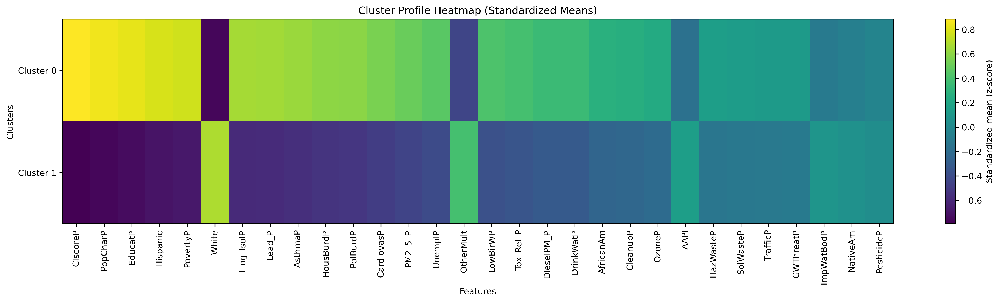

In [6]:
display(Image(filename=str(KMEANS_DIR / "cluster_heatmap_2.png")))

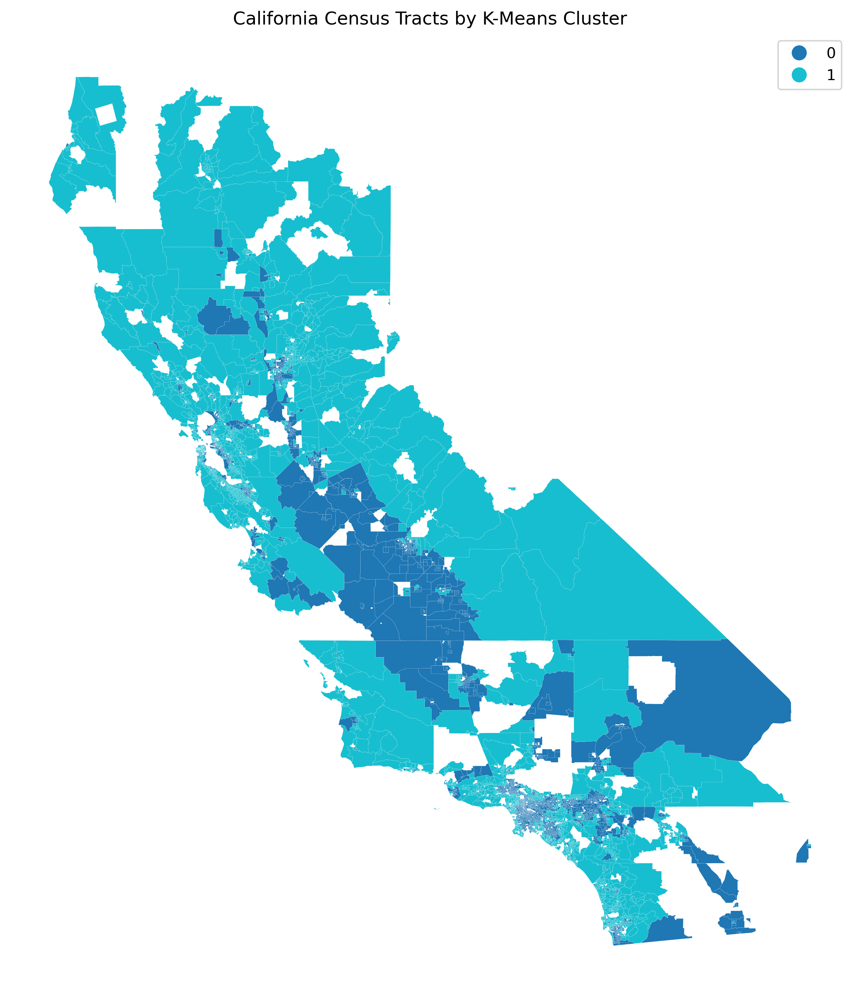

In [7]:
display(Image(filename=str(KMEANS_DIR / "cluster_map_2.png"), width=600 ))

### Four Clusters
We now look at the results when we set the number of clusters to 4. Using 4 clusters rather than 2 provides a more nuanced typology of Census Tracts than the binary clustering. Rather than a simple high-burden versus low-burden split, the four clusters capture gradations in environmental exposure, socioeconomic vulnerability, and racial composition.

Clusters 1 and 2 correspond strongly to Clusters 1 and 0 in the first model, respectively. These are typefied by either very high or low CalEnviroScreen scores, as well as their proportions of Hispanic and White populations. Clusters 0 and 3 occupy more intermediate typologies. Cluster 0 has higher rates of poverty, asthma, cardiovascular disease, and pesticide exposure. It has lower rates of lead exposure, toxic releases, traffic, hazardous waste, and overall pollution burdens. This indicates that this cluster is typefied by higher population characteristic burden but less pollution burden. This cluster also has higher proportions of Hispanic individuals and lower proportions of White and Asian and Pacific Islander populations. Cluster 3 is somewhat opposite, with higher overall pollution burden but less population characteristic burden, such as low rates of poverty, asthma, cardiovascular disease, unemployment, and so forth. This cluster also has higher proportions of Asian and Pacific Islander populations and lower Hispanic populations. These intermediate clusters highlight that environmental burden and social vulnerability do not always align, and that differenes in these metrics may also align with differences in racial demographics.

Interestingly, we still see geographic patterns in cluster assignment with 4 clusters, similar to as we had with the 2 clusters. Census Tracts assigned to Cluster 0 are mostly found in central Northern California, and the Southeast region of the state. Cluster 1 Census Tracts are found in the coastal area of northern California and outside of the main metropolitan regions of the state, indicating that these might be more suburban locations with less vulnerability. Cluster 2 Census Tracts are mostly located in the Southern Central Valley and throughout the Los Angeles and Inland Empire regions, indicating that these are the places with the highest cumulative burden, as well as high proportions of Hispanic individuals. Cluster 3 Census Tracts are mostly found in the Bay Area, San Diego, and dispersed through the Los Angeles and Inland Empire regions, indicating that these are areas with higher pollution burden but less population characteristic burden.

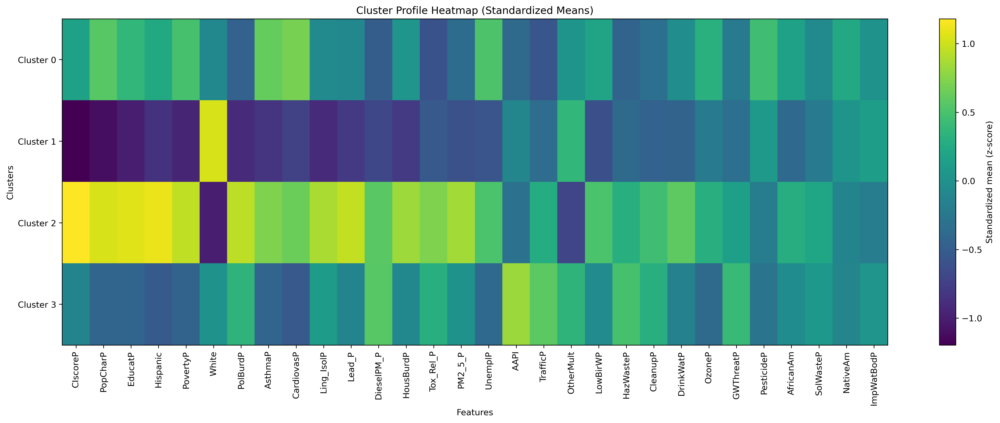

In [8]:
display(Image(filename=str(KMEANS_DIR / "cluster_heatmap_4.png")))

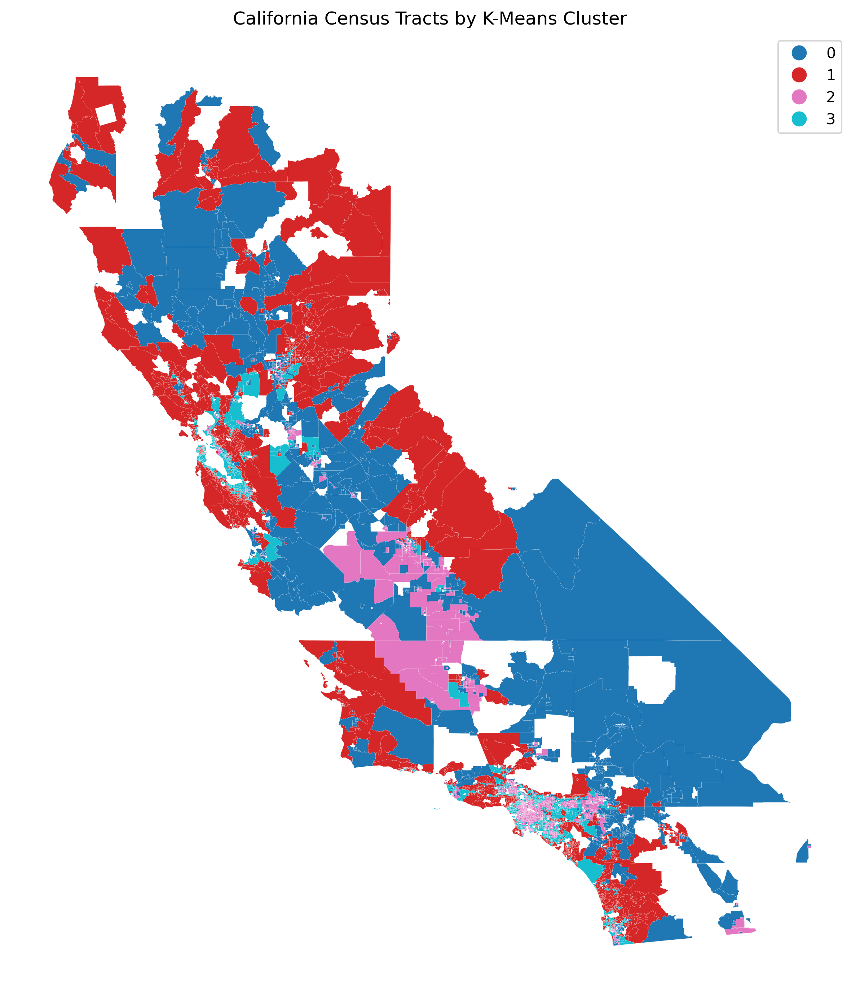

In [9]:
display(Image(filename=str(KMEANS_DIR / "cluster_map_4.png"), width=600))

## Author Contributions:


**Sunghyun Ahn:** Led the clustering/modeling work (K-means), including the initial model setup and evaluation using the elbow method and silhouette score. Set up the project’s reproducibility infrastructure, including `environment.yml`, the MyST configuration (`myst.yml`), and the `Makefile` automation.

**Megan Dhillon:** Created the map_analysis.ipynb notebook, wrote qmap function and tests for this function. 

**Yoohan Park:** Created the chart_analysis.ipynb notebook and authored the project documentation in README.md.

**Breitling Snyder:** Collaborated with Sunghyun on the kmeans_analysis.ipynb notebook, including initial model setup and adding cluster visualizations, added results from this notebook to the main.ipynb notebook, wrote clean_data function and tests for this function. 